<a href="https://colab.research.google.com/github/Arifuzzamanjoy/BoneGAN-Generative-Adversarial-Networks-for-Bone-Conducted-Speech/blob/main/Bone_GAN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:

import librosa
import numpy as np

import numpy as np
from scipy.signal import stft

import os
from natsort import natsorted


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import warnings
warnings.filterwarnings("ignore")
import librosa
import numpy as np

import numpy as np
from scipy.signal import stft

import os
from natsort import natsorted
import tensorflow as tf
#import bone audio and clean audio
import librosa
import numpy as np
import os

# Define the paths of the subfolders
from scipy import signal


# Define a list to store the STFT frames
stft_frames_c = []
stft_frames_n=[]
#C:\Users\Acer\Downloads\Compressed\DNN
clean_folder = "/content/drive/MyDrive/Colab Notebooks/DNN/clean"
noise_folder = "/content/drive/MyDrive/Colab Notebooks/DNN/noisy"
# read all audio from clean_folder and noise_folder
stft_frames_c = []
stft_frames_n=[]
#C:\Users\Acer\Downloads\Compressed\DNN
clean_files=os.listdir(clean_folder)
noise_files=os.listdir(noise_folder)

# Define the number of repetitions along each axis
reps_vertical = 2
reps_horizontal = 8

# Initialize an empty list to store the stacked slices
stacked_slices_n = []
stacked_slices_c = []
stacked_slices_n1=[]
stacked_slices_c1=[]
stft_frames_c = []
stft_frames_n=[]
# sort the file names using natural sorting
clean_files = natsorted(clean_files)
noise_files = natsorted(noise_files)

sr=16000
window = signal.hann(256) # Hann window of size 256
nfft = 256 # FFT length of 256
noverlap = int(0.75 * nfft) # Overlap length of 75% of FFT length
slices_c_vertical_list = []
slices_n_vertical_list = []
# Loop through two audio file in clean_files and noise_files those flow natural sorting as an windows
for clean_file,noise_file in zip(natsorted(clean_files),natsorted(noise_files)):
    # Initialize an empty list for each file
    file_slices_n = []
    file_slices_c = []
    Zxx_noisy=[]
    Zxx_clean=[]
    Zxx_cleanabs=np.array([])
    Zxx_noisyabs=np.array([])
    # Read the clean audio file
    clean_audio,sr=librosa.load(os.path.join(clean_folder,clean_file),sr=sr)
    # Read the noise audio file
    noise_audio,sr=librosa.load(os.path.join(noise_folder,noise_file),sr=sr)

    if len(clean_audio) > len(noise_audio):
        clean_audio = clean_audio[:len(noise_audio)]
    else:
        noise_audio = noise_audio[:len(clean_audio)]

    # Compute STFT of clean and noisy audio using the defined parameters
    f, t, Zxx_noisy = signal.stft(noise_audio, sr, window, nfft, noverlap)
    f, t, Zxx_clean = signal.stft(clean_audio, sr, window, nfft, noverlap)
    Zxx_clean=np.abs(Zxx_clean)
    Zxx_noisy=np.abs(Zxx_noisy)
    # Convert complex numbers to real and imaginary parts and stack them along a new axis
    Zxx_cleanabs=np.stack(Zxx_clean)
    Zxx_noisyabs=np.stack(Zxx_noisy)
    print('Zxx_cleanabs',Zxx_cleanabs.shape)




    n_time = Zxx_cleanabs.shape[1]
        #Calculate the number of slices of 8 frames
    n_slices = n_time // 32
    slice_c_horizontal1=np.array([])
    slice_n_horizontal1=np.array([])
        # Loop through the slices and append them to the list
    for i in range(n_slices):
            # Slice 8 frames from the STFT matrix
        stft_frames_n=[]
        stft_frames_c=[]
        pad_width=0
        slice_c_horizontal=np.array([])
        slice_c_vertical=np.array([])
        slice_n_vertical=np.array([])
        slice_n_horizontal=np.array([])
        slice_n = Zxx_noisyabs[:,i*32:(i+1)*32]
        slice_c = Zxx_cleanabs[:,i*32:(i+1)*32]
        if slice_n.shape[1] < 32:
            pad_width = 32 - slice_n.shape[1]
            slice_n = np.pad(slice_n, ((0,0),(0,pad_width)))
            slice_c = np.pad(slice_c, ((0,0),(0,pad_width)))


        if slice_n.shape[1] == 32:

            print('slice_c',slice_c.shape)
            slice_c_horizontal = np.repeat(slice_c, reps_horizontal, axis=1)
            slice_n_horizontal = np.repeat(slice_n, reps_horizontal, axis=1)
            print('slice_c_horizontal',slice_c_horizontal.shape)

        #slice_c_vertical = np.repeat(slice_c_horizontal, reps_vertical, axis=0)
        #slice_n_vertical = np.repeat(slice_n_horizontal, reps_vertical, axis=0)
        slice_c_vertical=np.concatenate((slice_c_horizontal,slice_c_horizontal))
        slice_n_vertical=np.concatenate((slice_n_horizontal,slice_n_horizontal))
        print(slice_c_vertical.shape)

        slices_c_vertical_list.append(slice_c_vertical)
        slices_n_vertical_list.append(slice_n_vertical)
        #create an 3D ima

    #concatenate apeend 256*256 images along next axis (Like (n,256,256))))

    slices_c_vertical_stacked = np.stack(slices_c_vertical_list, axis=0)
    slices_n_vertical_stacked = np.stack(slices_n_vertical_list, axis=0)
    #slices_c_vertical_stacked.shape= (146, 258, 256)
    #here 146 is the number of images and 258 is the number of frames and 256 is the number of frequency bins
    #create an 3D image of 258*256*3 for each consecutive images

# Initialize an empty list to store the 3D images
images_c_3d = []

# Loop through the stacked slices with a step of 3
for i in range(0, len(slices_c_vertical_stacked), 3):
    # Check if i+2 is less than the length of slices_c_vertical_stacked
    if i + 2 < len(slices_c_vertical_stacked):
        # Stack three consecutive images along the third axis
        image_3d = np.dstack([slices_c_vertical_stacked[i], slices_c_vertical_stacked[i+1], slices_c_vertical_stacked[i+2]])
        # Append the 3D image to the list
        images_c_3d.append(image_3d)

# Convert the list of 3D images into a numpy array
images_c_3d = np.array(images_c_3d)
print(images_c_3d.shape)
# Initialize an empty list to store the 3D images
images_n_3d = []

# Loop through the stacked slices with a step of 3
for i in range(0, len(slices_n_vertical_stacked), 3):
    # Check if i+2 is less than the length of slices_c_vertical_stacked
    if i + 2 < len(slices_n_vertical_stacked):
        # Stack three consecutive images along the third axis
        image_3d = np.dstack([slices_n_vertical_stacked[i], slices_n_vertical_stacked[i+1], slices_n_vertical_stacked[i+2]])
        # Append the 3D image to the list
        images_n_3d.append(image_3d)

# Convert the list of 3D images into a numpy array
images_n_3d = np.array(images_n_3d)

print(images_n_3d.shape)




Zxx_cleanabs (129, 994)
slice_c (129, 32)
slice_c_horizontal (129, 256)
(258, 256)
slice_c (129, 32)
slice_c_horizontal (129, 256)
(258, 256)
slice_c (129, 32)
slice_c_horizontal (129, 256)
(258, 256)
slice_c (129, 32)
slice_c_horizontal (129, 256)
(258, 256)
slice_c (129, 32)
slice_c_horizontal (129, 256)
(258, 256)
slice_c (129, 32)
slice_c_horizontal (129, 256)
(258, 256)
slice_c (129, 32)
slice_c_horizontal (129, 256)
(258, 256)
slice_c (129, 32)
slice_c_horizontal (129, 256)
(258, 256)
slice_c (129, 32)
slice_c_horizontal (129, 256)
(258, 256)
slice_c (129, 32)
slice_c_horizontal (129, 256)
(258, 256)
slice_c (129, 32)
slice_c_horizontal (129, 256)
(258, 256)
slice_c (129, 32)
slice_c_horizontal (129, 256)
(258, 256)
slice_c (129, 32)
slice_c_horizontal (129, 256)
(258, 256)
slice_c (129, 32)
slice_c_horizontal (129, 256)
(258, 256)
slice_c (129, 32)
slice_c_horizontal (129, 256)
(258, 256)
slice_c (129, 32)
slice_c_horizontal (129, 256)
(258, 256)
slice_c (129, 32)
slice_c_horizo

In [ ]:
target_tensor = tf.convert_to_tensor(images_c_3d)
print(target_tensor.shape)
input_tensor=tf.convert_to_tensor(images_n_3d)

print(input_tensor.shape)


(48, 258, 256, 3)
(48, 258, 256, 3)


In [ ]:
input_image = tf.cast(input_tensor, tf.float32)
real_image = tf.cast(target_tensor, tf.float32)
print(real_image.shape)

(48, 258, 256, 3)


In [ ]:
# The facade training set consist of 400 images
BUFFER_SIZE = 400
# The batch size of 1 produced better results for the U-Net in the original pix2pix experiment
BATCH_SIZE = 1
# Each image is 256x256 in size
IMG_WIDTH = 256
IMG_HEIGHT = 256

In [ ]:
input_image = tf.image.resize(input_image, [IMG_HEIGHT, IMG_WIDTH],
                                method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
real_image = tf.image.resize(real_image, [IMG_HEIGHT, IMG_WIDTH],
                               method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
print(input_image.shape)

(48, 256, 256, 3)


In [ ]:
inp=input_image[0]
print(inp.shape)
re=real_image[0]
print(re.shape)

(256, 256, 3)
(256, 256, 3)


In [ ]:
import tensorflow as tf

def crop_and_normalize_image(image):
  image = tf.image.per_image_standardization(image)
  return image
input_image = crop_and_normalize_image(input_image)
real_image = crop_and_normalize_image(real_image)



In [ ]:
import tensorflow as tf

def crop_and_normalize_image(image):
  """Crops and normalizes an image.

  Args:
    image: A tf.Tensor representing the image.

  Returns:
    A tf.Tensor representing the cropped and normalized image.
  """

  # Crop the image to the center 256x256 pixels.
  #image = tf.image.central_crop(image, 0.5)

  # Normalize the image to the range [0, 1].
  image = tf.image.per_image_standardization(image)

  return image

# Crop and normalize the input and real images.
input_image = crop_and_normalize_image(input_image)
real_image = crop_and_normalize_image(real_image)


In [ ]:
print(input_image[0].shape)

(256, 256, 3)


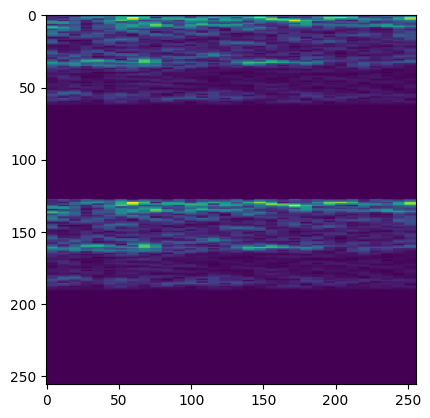

In [ ]:
import matplotlib.pyplot as plt
plt.imshow(real_image[0,:,:,1])

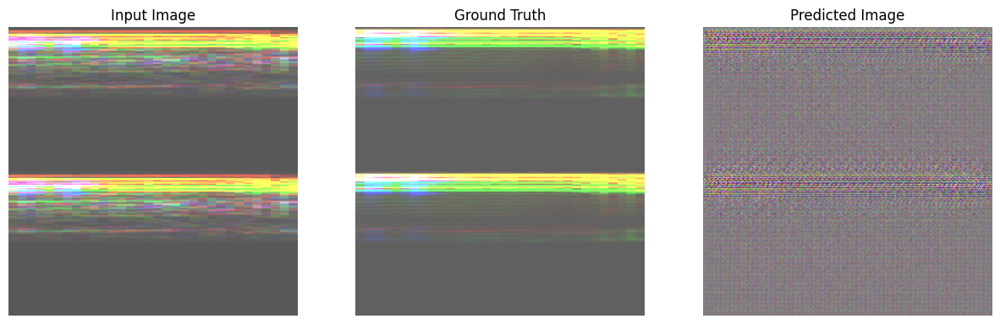

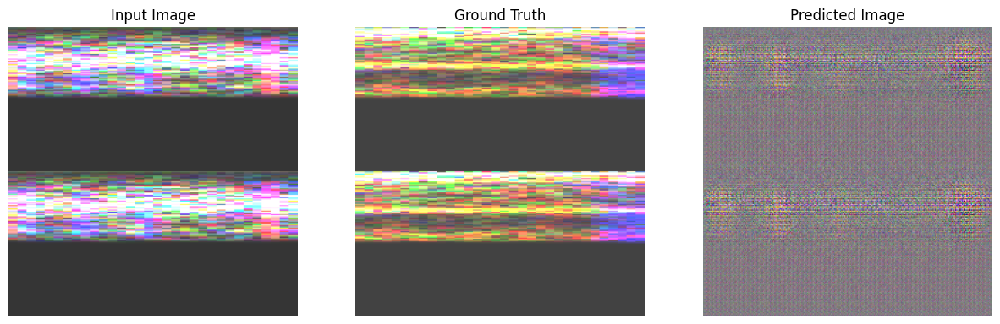

In [ ]:
# Create a dataset from the input_image and real_image tensors
dataset = tf.data.Dataset.from_tensor_slices((input_image, real_image))

# Shuffle, batch, and resize the dataset
dataset = dataset.shuffle(BUFFER_SIZE)
dataset = dataset.batch(BATCH_SIZE)
dataset = dataset.map(lambda x, y: (tf.image.resize(x, [IMG_HEIGHT, IMG_WIDTH]), tf.image.resize(y, [IMG_HEIGHT, IMG_WIDTH])))

# Split the dataset into train and test sets
test_size = int(len(dataset) * 0.15)
test_dataset = dataset.take(test_size)
train_dataset = dataset.skip(test_size)

# Iterate over the test set and generate images
for example_input, example_target in test_dataset.take(2):
  generate_images(generator, example_input, example_target)


In [ ]:
# Convert the input_image tensor to a tf.data.Dataset object

train_dataset



<_SkipDataset element_spec=(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None))>

In [ ]:

test_size = int(len(train_dataset)*0.15)  # Determine the size of your test set
test_dataset = train_dataset.take(test_size)  # Take that many samples from your train_dataset



In [ ]:
try:
  test_dataset = tf.data.Dataset.list_files(str(PATH / 'test/*.jpg'))
except tf.errors.InvalidArgumentError:
  test_dataset = tf.data.Dataset.list_files(str(PATH / 'val/*.jpg'))
test_dataset = test_dataset.map(load_image_test)
test_dataset = test_dataset.batch(BATCH_SIZE)

In [ ]:
dataset_name = "maps" #@param ["cityscapes", "edges2handbags", "edges2shoes", "facades", "maps", "night2day"]


In [ ]:
list(PATH.parent.iterdir())

[PosixPath('/root/.keras/datasets/maps'),
 PosixPath('/root/.keras/datasets/maps.tar.gz')]

In [ ]:
sample_image = tf.io.read_file(str(PATH / 'train/1.jpg'))
sample_image = tf.io.decode_jpeg(sample_image)
print(sample_image.shape)

(600, 1200, 3)


In [ ]:
input_image = tf.cast(input_tensor, tf.float32)
real_image = tf.cast(target_tensor, tf.float32)
real_image.shape

## Build the generator

The generator of your pix2pix cGAN is a _modified_ [U-Net](https://arxiv.org/abs/1505.04597){:.external}. A U-Net consists of an encoder (downsampler) and decoder (upsampler). (You can find out more about it in the [Image segmentation](../images/segmentation.ipynb) tutorial and on the [U-Net project website](https://lmb.informatik.uni-freiburg.de/people/ronneber/u-net/){:.external}.)

- Each block in the encoder is: Convolution -> Batch normalization -> Leaky ReLU
- Each block in the decoder is: Transposed convolution -> Batch normalization -> Dropout (applied to the first 3 blocks) -> ReLU
- There are skip connections between the encoder and decoder (as in the U-Net).

Define the downsampler (encoder):

In [ ]:
OUTPUT_CHANNELS = 3

In [ ]:
def downsample(filters, size, apply_batchnorm=True):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
      tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                             kernel_initializer=initializer, use_bias=False))

  if apply_batchnorm:
    result.add(tf.keras.layers.BatchNormalization())

  result.add(tf.keras.layers.LeakyReLU())

  return result

In [ ]:
down_model = downsample(3, 4)
down_result = down_model(tf.expand_dims(inp, 0))
print (down_result.shape)

(1, 128, 128, 3)


Define the upsampler (decoder):

In [ ]:
def upsample(filters, size, apply_dropout=False):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
    tf.keras.layers.Conv2DTranspose(filters, size, strides=2,
                                    padding='same',
                                    kernel_initializer=initializer,
                                    use_bias=False))

  result.add(tf.keras.layers.BatchNormalization())

  if apply_dropout:
      result.add(tf.keras.layers.Dropout(0.5))

  result.add(tf.keras.layers.ReLU())

  return result

In [ ]:
up_model = upsample(3, 4)
up_result = up_model(down_result)
print (up_result.shape)

(1, 256, 256, 3)


Define the generator with the downsampler and the upsampler:

In [ ]:
def Generator():
  inputs = tf.keras.layers.Input(shape=[256, 256, 3])

  down_stack = [
    downsample(64, 4, apply_batchnorm=False),  # (batch_size, 128, 128, 64)
    downsample(128, 4),  # (batch_size, 64, 64, 128)
    downsample(256, 4),  # (batch_size, 32, 32, 256)
    downsample(512, 4),  # (batch_size, 16, 16, 512)
    downsample(512, 4),  # (batch_size, 8, 8, 512)
    downsample(512, 4),  # (batch_size, 4, 4, 512)
    downsample(512, 4),  # (batch_size, 2, 2, 512)
    downsample(512, 4),  # (batch_size, 1, 1, 512)
  ]

  up_stack = [
    upsample(512, 4, apply_dropout=True),  # (batch_size, 2, 2, 1024)
    upsample(512, 4, apply_dropout=True),  # (batch_size, 4, 4, 1024)
    upsample(512, 4, apply_dropout=True),  # (batch_size, 8, 8, 1024)
    upsample(512, 4),  # (batch_size, 16, 16, 1024)
    upsample(256, 4),  # (batch_size, 32, 32, 512)
    upsample(128, 4),  # (batch_size, 64, 64, 256)
    upsample(64, 4),  # (batch_size, 128, 128, 128)
  ]

  initializer = tf.random_normal_initializer(0., 0.02)
  last = tf.keras.layers.Conv2DTranspose(OUTPUT_CHANNELS, 4,
                                         strides=2,
                                         padding='same',
                                         kernel_initializer=initializer,
                                         activation='tanh')  # (batch_size, 256, 256, 3)

  x = inputs

  # Downsampling through the model
  skips = []
  for down in down_stack:
    x = down(x)
    skips.append(x)

  skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    x = tf.keras.layers.Concatenate()([x, skip])

  x = last(x)

  return tf.keras.Model(inputs=inputs, outputs=x)

Visualize the generator model architecture:

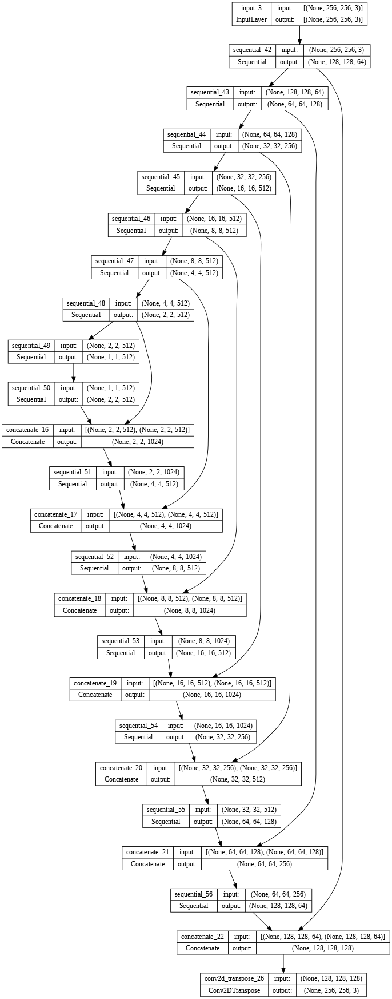

In [ ]:
generator = Generator()
tf.keras.utils.plot_model(generator, show_shapes=True, dpi=64)

Test the generator:

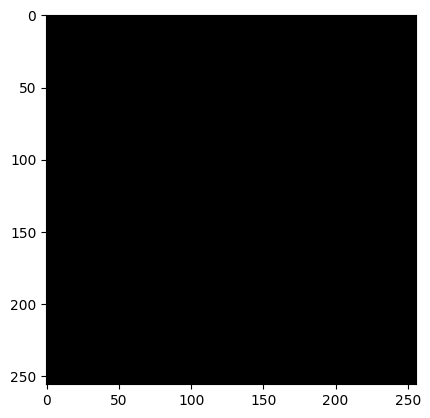

In [ ]:
gen_output = generator(inp[tf.newaxis, ...], training=False)
plt.imshow(gen_output[0, ...])

### Define the generator loss

GANs learn a loss that adapts to the data, while cGANs learn a structured loss that penalizes a possible structure that differs from the network output and the target image, as described in the [pix2pix paper](https://arxiv.org/abs/1611.07004){:.external}.

- The generator loss is a sigmoid cross-entropy loss of the generated images and an **array of ones**.
- The pix2pix paper also mentions the L1 loss, which is a MAE (mean absolute error) between the generated image and the target image.
- This allows the generated image to become structurally similar to the target image.
- The formula to calculate the total generator loss is `gan_loss + LAMBDA * l1_loss`, where `LAMBDA = 100`. This value was decided by the authors of the paper.

In [ ]:
LAMBDA = 100

In [ ]:
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [ ]:
def generator_loss(disc_generated_output, gen_output, target):
  gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)

  # Mean absolute error
  l1_loss = tf.reduce_mean(tf.abs(target - gen_output))

  total_gen_loss = gan_loss + (LAMBDA * l1_loss)

  return total_gen_loss, gan_loss, l1_loss

The training procedure for the generator is as follows:

![Generator Update Image](https://github.com/tensorflow/docs/blob/master/site/en/tutorials/generative/images/gen.png?raw=1)


## Build the discriminator

The discriminator in the pix2pix cGAN is a convolutional PatchGAN classifier—it tries to classify if each image _patch_ is real or not real, as described in the [pix2pix paper](https://arxiv.org/abs/1611.07004){:.external}.

- Each block in the discriminator is: Convolution -> Batch normalization -> Leaky ReLU.
- The shape of the output after the last layer is `(batch_size, 30, 30, 1)`.
- Each `30 x 30` image patch of the output classifies a `70 x 70` portion of the input image.
- The discriminator receives 2 inputs:
    - The input image and the target image, which it should classify as real.
    - The input image and the generated image (the output of the generator), which it should classify as fake.
    - Use `tf.concat([inp, tar], axis=-1)` to concatenate these 2 inputs together.

Let's define the discriminator:

In [ ]:
def Discriminator():
  initializer = tf.random_normal_initializer(0., 0.02)

  inp = tf.keras.layers.Input(shape=[256, 256, 3], name='input_image')
  tar = tf.keras.layers.Input(shape=[256, 256, 3], name='target_image')

  x = tf.keras.layers.concatenate([inp, tar])  # (batch_size, 256, 256, channels*2)

  down1 = downsample(64, 4, False)(x)  # (batch_size, 128, 128, 64)
  down2 = downsample(128, 4)(down1)  # (batch_size, 64, 64, 128)
  down3 = downsample(256, 4)(down2)  # (batch_size, 32, 32, 256)

  zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3)  # (batch_size, 34, 34, 256)
  conv = tf.keras.layers.Conv2D(512, 4, strides=1,
                                kernel_initializer=initializer,
                                use_bias=False)(zero_pad1)  # (batch_size, 31, 31, 512)

  batchnorm1 = tf.keras.layers.BatchNormalization()(conv)

  leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)

  zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu)  # (batch_size, 33, 33, 512)

  last = tf.keras.layers.Conv2D(1, 4, strides=1,
                                kernel_initializer=initializer)(zero_pad2)  # (batch_size, 30, 30, 1)

  return tf.keras.Model(inputs=[inp, tar], outputs=last)

Visualize the discriminator model architecture:

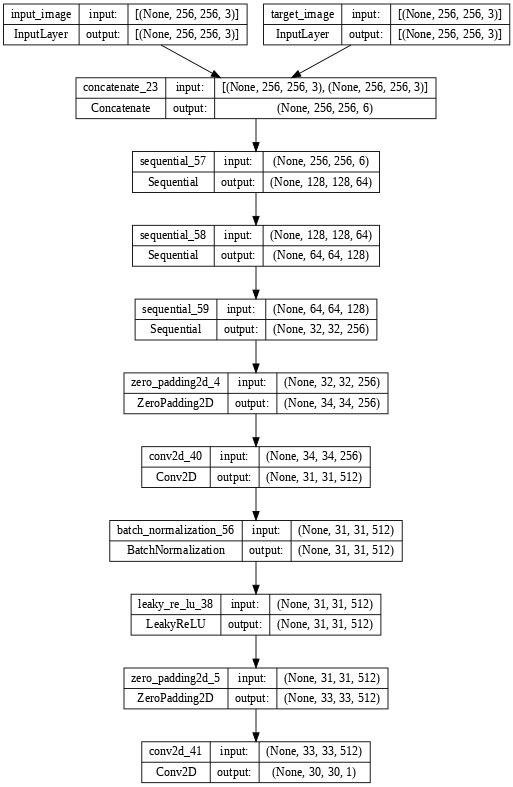

In [ ]:
discriminator = Discriminator()
tf.keras.utils.plot_model(discriminator, show_shapes=True, dpi=64)

Test the discriminator:

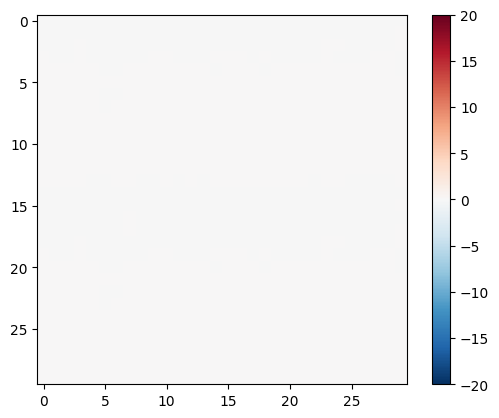

In [ ]:
disc_out = discriminator([inp[tf.newaxis, ...], gen_output], training=False)
plt.imshow(disc_out[0, ..., -1], vmin=-20, vmax=20, cmap='RdBu_r')
plt.colorbar()

### Define the discriminator loss

- The `discriminator_loss` function takes 2 inputs: **real images** and **generated images**.
- `real_loss` is a sigmoid cross-entropy loss of the **real images** and an **array of ones(since these are the real images)**.
- `generated_loss` is a sigmoid cross-entropy loss of the **generated images** and an **array of zeros (since these are the fake images)**.
- The `total_loss` is the sum of `real_loss` and `generated_loss`.

In [ ]:
def discriminator_loss(disc_real_output, disc_generated_output):
  real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)

  generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)

  total_disc_loss = real_loss + generated_loss

  return total_disc_loss

The training procedure for the discriminator is shown below.

To learn more about the architecture and the hyperparameters you can refer to the [pix2pix paper](https://arxiv.org/abs/1611.07004){:.external}.

![Discriminator Update Image](https://github.com/tensorflow/docs/blob/master/site/en/tutorials/generative/images/dis.png?raw=1)


## Define the optimizers and a checkpoint-saver


In [ ]:
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

In [ ]:
checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

## Generate images

Write a function to plot some images during training.

- Pass images from the test set to the generator.
- The generator will then translate the input image into the output.
- The last step is to plot the predictions and _voila_!

Note: The `training=True` is intentional here since you want the batch statistics, while running the model on the test dataset. If you use `training=False`, you get the accumulated statistics learned from the training dataset (which you don't want).

In [ ]:
def generate_images(model, test_input, tar):
  prediction = model(test_input, training=True)
  plt.figure(figsize=(15, 15))

  display_list = [test_input[0], tar[0], prediction[0]]
  title = ['Input Image', 'Ground Truth', 'Predicted Image']

  for i in range(3):
    plt.subplot(1, 3, i+1)
    plt.title(title[i])
    # Getting the pixel values in the [0, 1] range to plot.
    plt.imshow(display_list[i] * 0.5 + 0.5)
    plt.axis('off')
  plt.show()

Test the function:

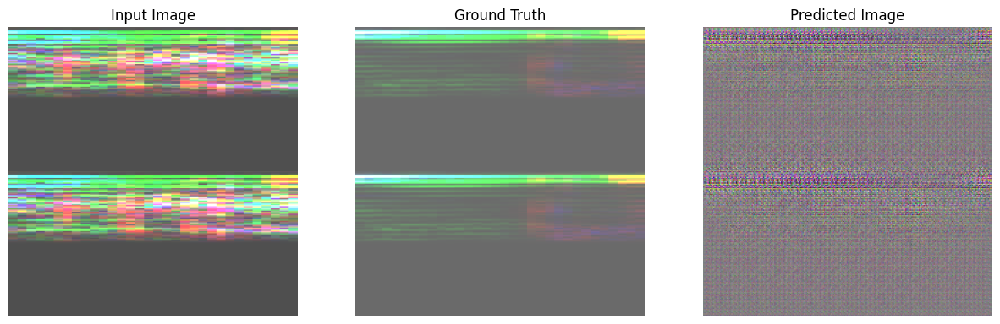

In [ ]:
for example_input, example_target in test_dataset.take(1):
  generate_images(generator, example_input, example_target)


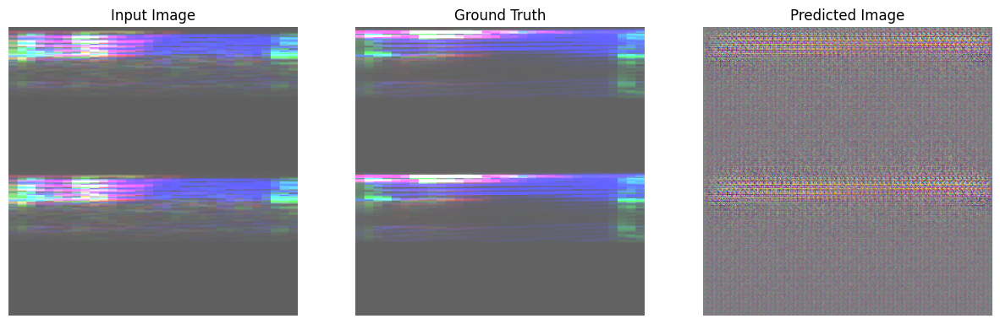

In [ ]:
for example_input, example_target in test_dataset.take(1):
  generate_images(generator, example_input, example_target)

## Training

- For each example input generates an output.
- The discriminator receives the `input_image` and the generated image as the first input. The second input is the `input_image` and the `target_image`.
- Next, calculate the generator and the discriminator loss.
- Then, calculate the gradients of loss with respect to both the generator and the discriminator variables(inputs) and apply those to the optimizer.
- Finally, log the losses to TensorBoard.

In [ ]:
import datetime


In [ ]:
log_dir="logs/"

summary_writer = tf.summary.create_file_writer(
  log_dir + "fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

In [ ]:
@tf.function
def train_step(input_image, target, step):
  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    gen_output = generator(input_image, training=True)

    disc_real_output = discriminator([input_image, target], training=True)
    disc_generated_output = discriminator([input_image, gen_output], training=True)

    gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
    disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

  generator_gradients = gen_tape.gradient(gen_total_loss,
                                          generator.trainable_variables)
  discriminator_gradients = disc_tape.gradient(disc_loss,
                                               discriminator.trainable_variables)

  generator_optimizer.apply_gradients(zip(generator_gradients,
                                          generator.trainable_variables))
  discriminator_optimizer.apply_gradients(zip(discriminator_gradients,
                                              discriminator.trainable_variables))

  with summary_writer.as_default():
    tf.summary.scalar('gen_total_loss', gen_total_loss, step=step//1000)
    tf.summary.scalar('gen_gan_loss', gen_gan_loss, step=step//1000)
    tf.summary.scalar('gen_l1_loss', gen_l1_loss, step=step//1000)
    tf.summary.scalar('disc_loss', disc_loss, step=step//1000)

The actual training loop. Since this tutorial can run of more than one dataset, and the datasets vary greatly in size the training loop is setup to work in steps instead of epochs.

- Iterates over the number of steps.
- Every 10 steps print a dot (`.`).
- Every 1k steps: clear the display and run `generate_images` to show the progress.
- Every 5k steps: save a checkpoint.

In [ ]:
######

def fit(train_ds, test_ds, steps):
  example_input, example_target = next(iter(test_ds))
  start = time.time()

  for step, (input_image, target) in train_ds.repeat().take(steps).enumerate():
    if (step) % 1000 == 0:
      display.clear_output(wait=True)

      if step != 0:
        print(f'Time taken for 1000 steps: {time.time()-start:.2f} sec\n')

      start = time.time()

      generate_images(generator, example_input, example_target)
      print(f"Step: {step//1000}k")

    train_step(input_image, target, step)

    # Training step
    if (step+1) % 10 == 0:
      print('.', end='', flush=True)


    # Save (checkpoint) the model every 5k steps
    if (step + 1) % 5000 == 0:
      checkpoint.save(file_prefix=checkpoint_prefix)

In [ ]:
def fit(train_ds, test_ds, steps):
  example_input, example_target = next(iter(test_ds.take(1)))
  start = time.time()

  for step, (input_image, target) in train_ds.repeat().take(steps).enumerate():
    if (step) % 1000 == 0:
      display.clear_output(wait=True)

      if step != 0:
        print(f'Time taken for 1000 steps: {time.time()-start:.2f} sec\n')

      start = time.time()

      generate_images(generator, example_input, example_target)
      print(f"Step: {step//1000}k")

    train_step(input_image, target, step)

    # Training step
    if (step+1) % 10 == 0:
      print('.', end='', flush=True)


    # Save (checkpoint) the model every 5k steps
    if (step + 1) % 5000 == 0:
      checkpoint.save(file_prefix=checkpoint_prefix)

This training loop saves logs that you can view in TensorBoard to monitor the training progress.

If you work on a local machine, you would launch a separate TensorBoard process. When working in a notebook, launch the viewer before starting the training to monitor with TensorBoard.

Launch the TensorBoard viewer (Sorry, this doesn't
display on tensorflow.org):

In [ ]:
%load_ext tensorboard
%tensorboard --logdir {log_dir}

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 30309), started 0:11:01 ago. (Use '!kill 30309' to kill it.)

<IPython.core.display.Javascript object>

You can view the [results of a previous run](https://tensorboard.dev/experiment/lZ0C6FONROaUMfjYkVyJqw) of this notebook on [TensorBoard.dev](https://tensorboard.dev/).

Finally, run the training loop:

In [ ]:
train_dataset

<_BatchDataset element_spec=TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None)>

In [ ]:
import time # \uD83D\uDC47️ import the time module first

def fit(train_ds, test_ds, steps):
  example_input, example_target = next(iter(test_ds.take(1)))
  start = time.time() # \uD83D\uDC49️ now you can use the time module
  ...


In [ ]:

import time

def fit(train_ds, test_ds, steps):
  example_input, example_target = next(iter(test_ds.take(1)))
  start = time.time()
  total_samples = len(list(train_dataset))
  batch_size = 32

  steps_per_epoch = int(total_samples / batch_size)

  for epoch in range(100):
    for step in range(steps_per_epoch):
      x_batch_train, y_batch_train = next(iter(train_ds.batch(batch_size)))
      train_loss = train_step(x_batch_train, y_batch_train, step)

    print(f'Epoch {epoch + 1}, Loss: {train_loss}, Time: {time.time() - start}')
fit(train_dataset, test_dataset, steps=400)


ValueError: ignored

In [ ]:
total_samples = len(list(train_dataset))  # Total number of samples in the dataset
batch_size = 32  # The batch size you're using for training

steps_per_epoch = total_samples / batch_size

fit(train_dataset, epochs=100, steps_per_epoch=steps_per_epoch)


TypeError: ignored

In [ ]:
fit(train_dataset, test_dataset, steps=400)

Interpreting the logs is more subtle when training a GAN (or a cGAN like pix2pix) compared to a simple classification or regression model. Things to look for:

- Check that neither the generator nor the discriminator model has "won". If either the `gen_gan_loss` or the `disc_loss` gets very low, it's an indicator that this model is dominating the other, and you are not successfully training the combined model.
- The value `log(2) = 0.69` is a good reference point for these losses, as it indicates a perplexity of 2 - the discriminator is, on average, equally uncertain about the two options.
- For the `disc_loss`, a value below `0.69` means the discriminator is doing better than random on the combined set of real and generated images.
- For the `gen_gan_loss`, a value below `0.69` means the generator is doing better than random at fooling the discriminator.
- As training progresses, the `gen_l1_loss` should go down.

## Restore the latest checkpoint and test the network

In [ ]:
!ls {checkpoint_dir}

ls: cannot access './training_checkpoints': No such file or directory


In [ ]:
# Restoring the latest checkpoint in checkpoint_dir
checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))

## Generate some images using the test set

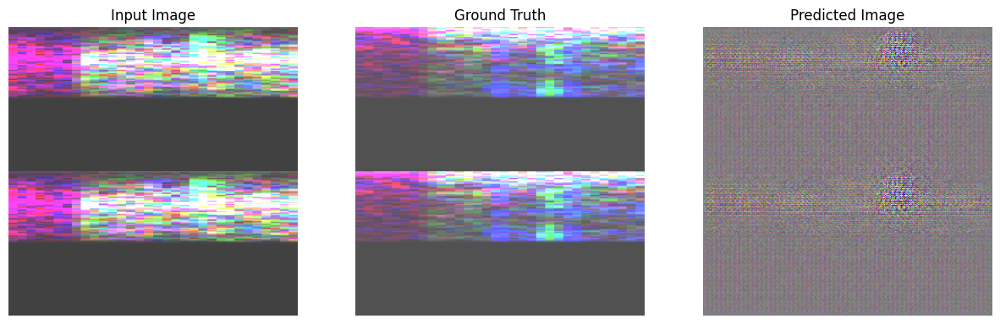

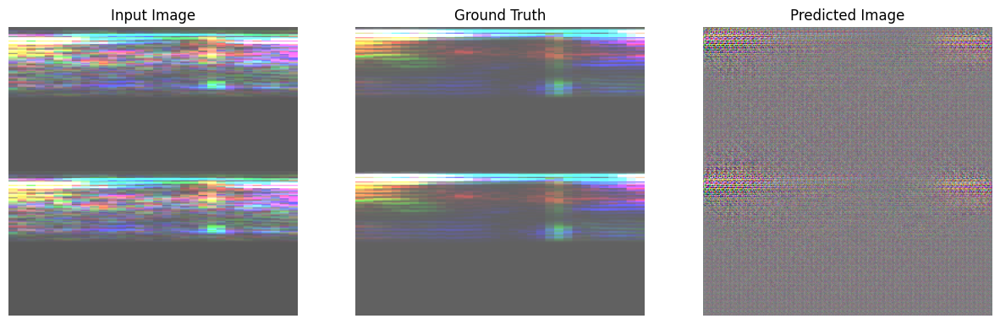

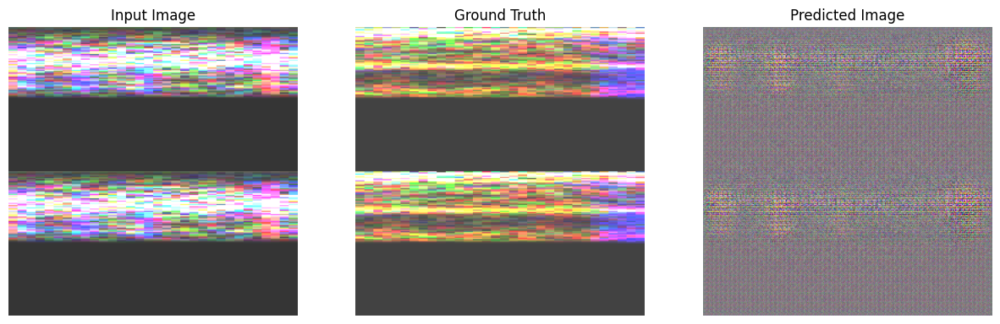

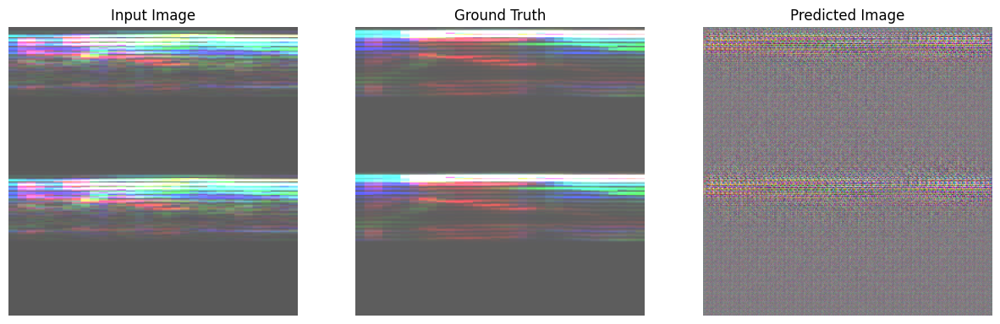

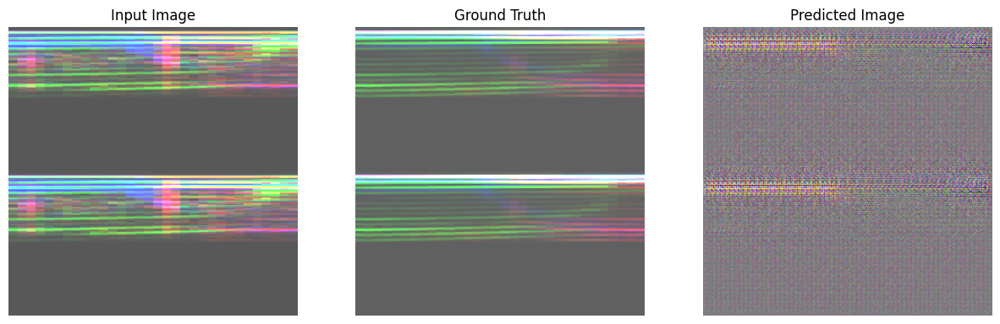

In [ ]:
# Run the trained model on a few examples from the test set
for inp, tar in test_dataset.take(5):
  generate_images(generator, inp, tar)

In [ ]:
print(list(test_dataset.take(5)))


[<tf.Tensor: shape=(1, 256, 256, 3), dtype=float32, numpy=
array([[[[-0.2895459 , -0.27919662, -0.27429774],
         [-0.2895459 , -0.27919662, -0.27429774],
         [-0.2895459 , -0.27919662, -0.27429774],
         ...,
         [-0.2760528 , -0.2831304 , -0.28558326],
         [-0.2760528 , -0.2831304 , -0.28558326],
         [-0.2760528 , -0.2831304 , -0.28558326]],

        [[-0.29354617, -0.2988572 , -0.2882128 ],
         [-0.29354617, -0.2988572 , -0.2882128 ],
         [-0.29354617, -0.2988572 , -0.2882128 ],
         ...,
         [-0.29657692, -0.2922686 , -0.31451324],
         [-0.29657692, -0.2922686 , -0.31451324],
         [-0.29657692, -0.2922686 , -0.31451324]],

        [[-0.2762197 , -0.30721486, -0.299871  ],
         [-0.2762197 , -0.30721486, -0.299871  ],
         [-0.2762197 , -0.30721486, -0.299871  ],
         ...,
         [-0.3060293 , -0.2640211 , -0.29986727],
         [-0.3060293 , -0.2640211 , -0.29986727],
         [-0.3060293 , -0.2640211 , -0.299867